### Effective Year Built Analysis 
In this notebook, our goal is to analyze any construction activity that has occurred in the City of Inglewood between the 2000 and 2020. This construction activity incldues any new construction, remodeling and/or rehabilitation of an existing property. 

This can provide insight to the activty that has been on going and might give a glimpse of what the future has in store for the City of Inglewood. The development of SoFi has provided an opportunity for developers to develop new projects through the purchasing of existing properties or rehabilitating properties to make them more "inviting" to newcomers.

In [1]:
# the usuals
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx
from sodapy import Socrata

# new for data viz
import seaborn as sns

# to explore point patterns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy

/opt/conda/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


In [2]:
# connecting to the data portal
client = Socrata("data.lacounty.gov", None)

results = client.get("9trm-uz8i",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND effectiveyearbuilt between 2000 and 2020")

df20 = pd.DataFrame.from_records(results)

We begin by importing the libraries we will be using to conduct this point pattern analysis and we also import the data from the data portal with all the properties that have been effectively built between the year 2000 and 2020.

In [3]:
df20.sample(2)

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,propertylocation,usetype,usecode,usecodedescchar1,...,rowid,center_lat,center_lon,location_1,situsdirection,usecodedescchar3,usecodedescchar4,situsfraction,situsunit,parcelclassification
8330,90301-2203,INGLEWOOD,4020011018,2021,04569,4020-011-018,331 S EUCALYPTUS AVE INGLEWOOD CA 90301,R-I,0200,Residential,...,20214020011018,33.959134210000002,-118.35988458,"{'latitude': '33.95913421', 'longitude': '-118...",S,4 Stories or Less,NaN,NaN,NaN,NaN
6665,90303,INGLEWOOD,4033016037,2009,11926,4033-016-037,"3932 W 111TH STREET, 2 INGLEWOOD CA 90303",CND,012C,Residential,...,20094033016037,33.93454502,-118.34289842,"{'latitude': '33.93454502', 'longitude': '-118...",W,Townhouse Format,Condominium,,2,


In [4]:
df20.shape

(8821, 51)

In [5]:
# convert pandas dataframe to geodataframe
gdf20 = gpd.GeoDataFrame(df20, 
                     crs='EPSG:4326',
                     geometry=gpd.points_from_xy(df20.center_lon, df20.center_lat))

In the previous cells I have produced a sample to make sure the data has imported to the notebook, I check the shape of the dataframe to see how many rows and columns were imported, and I convert the dataframe to a geodataframe so that I can plot this on a point analysis map later on.

In [6]:
# convert lat/lon to floats
df20.center_lon = df20.center_lon.astype('float')
df20.center_lat = df20.center_lat.astype('float')

Now that I have a geodataframe, I can transform the longitude and latitude columns to floats.

In [7]:
gdf20 = gdf20[gdf20.center_lon!=0]

I want to make sure that there are no "0" longitudes that might skew the data so I drop all longitudes that might be 0.

In [8]:
gdf20=gdf20[['taxratearea_city','usetype','usecodedescchar1','effectiveyearbuilt',
         'roll_totalvalue','center_lat','center_lon','geometry']]

I can now include only the columns that I am interested or might be potentially interested in. 

In [9]:
gdf20.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 8821 entries, 0 to 8820
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   taxratearea_city    8821 non-null   object  
 1   usetype             8807 non-null   object  
 2   usecodedescchar1    8821 non-null   object  
 3   effectiveyearbuilt  8821 non-null   object  
 4   roll_totalvalue     8821 non-null   object  
 5   center_lat          8821 non-null   float64 
 6   center_lon          8821 non-null   float64 
 7   geometry            8821 non-null   geometry
dtypes: float64(2), geometry(1), object(5)
memory usage: 620.2+ KB


I check the info of my data frame and can now plot it to get a sense of where the data is being mapped.

<AxesSubplot:>

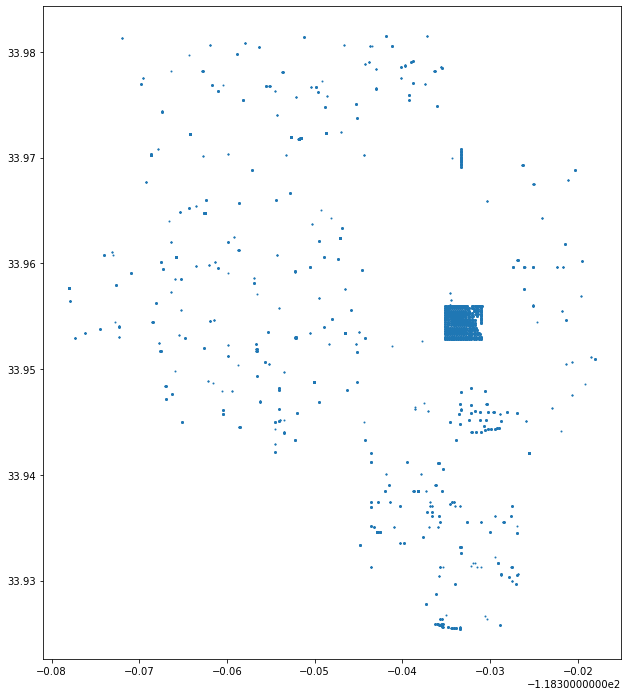

In [10]:
gdf20.plot(figsize=(12,12),
             markersize=1)

I can now begin to specifically look at the effective year column in the data and begin to pull data for sepcific years to determine the activity that occurred in those years.

In [11]:
gdf20.effectiveyearbuilt.value_counts()

2005    2941
2006    2735
2007     690
2000     527
2002     397
2004     346
2003     230
2008     221
2001     173
2010     119
2009      83
2011      71
2018      49
2016      48
2014      38
2013      34
2015      33
2019      31
2017      30
2012      20
2020       5
Name: effectiveyearbuilt, dtype: int64

In [12]:
gdf20[gdf20.effectiveyearbuilt == '2006'].head()

,taxratearea_city,usetype,usecodedescchar1,effectiveyearbuilt,roll_totalvalue,center_lat,center_lon,geometry
55,INGLEWOOD,R-I,Residential,2006,299017,33.974777,-118.348815,POINT (-118.34882 33.97478)
64,INGLEWOOD,CND,Residential,2006,229106,33.972354,-118.348674,POINT (-118.34867 33.97235)
66,INGLEWOOD,CND,Residential,2006,328973,33.972354,-118.348674,POINT (-118.34867 33.97235)
68,INGLEWOOD,CND,Residential,2006,480408,33.972354,-118.348674,POINT (-118.34867 33.97235)
85,INGLEWOOD,CND,Residential,2006,298380,33.972256,-118.364249,POINT (-118.36425 33.97226)


In [13]:
gdf20[gdf20.effectiveyearbuilt == '2016'].head()

,taxratearea_city,usetype,usecodedescchar1,effectiveyearbuilt,roll_totalvalue,center_lat,center_lon,geometry
8,INGLEWOOD,SFR,Residential,2016,516582,33.967540,-118.325151,POINT (-118.32515 33.96754)
37,INGLEWOOD,SFR,Residential,2016,498765,33.976917,-118.337471,POINT (-118.33747 33.97692)
42,INGLEWOOD,SFR,Residential,2016,318682,33.980541,-118.343653,POINT (-118.34365 33.98054)
58,INGLEWOOD,CND,Residential,2016,468180,33.976253,-118.349611,POINT (-118.34961 33.97625)
60,INGLEWOOD,CND,Residential,2016,468180,33.976253,-118.349611,POINT (-118.34961 33.97625)


In [14]:
gdf20[gdf20.effectiveyearbuilt == '2018'].head()

,taxratearea_city,usetype,usecodedescchar1,effectiveyearbuilt,roll_totalvalue,center_lat,center_lon,geometry
50,INGLEWOOD,R-I,Residential,2018,495675,33.977504,-118.340193,POINT (-118.34019 33.97750)
684,INGLEWOOD,C/I,Industrial,2018,639295,33.935107,-118.340937,POINT (-118.34094 33.93511)
7225,INGLEWOOD,R-I,Residential,2018,880099,33.975788,-118.348617,POINT (-118.34862 33.97579)
7250,INGLEWOOD,R-I,Residential,2018,554798,33.958630,-118.356959,POINT (-118.35696 33.95863)
7269,INGLEWOOD,R-I,Residential,2018,870018,33.976301,-118.354519,POINT (-118.35452 33.97630)


In [15]:
gdf20[gdf20.effectiveyearbuilt == '2020'].head()

,taxratearea_city,usetype,usecodedescchar1,effectiveyearbuilt,roll_totalvalue,center_lat,center_lon,geometry
8283,INGLEWOOD,C/I,Commercial,2020,54454294,33.952159,-118.341128,POINT (-118.34113 33.95216)
8496,INGLEWOOD,C/I,Recreational,2020,718898936,33.952628,-118.337813,POINT (-118.33781 33.95263)
8790,INGLEWOOD,NaN,(missing),2020,552878,33.926355,-118.330393,POINT (-118.33039 33.92636)
8797,INGLEWOOD,NaN,(missing),2020,512734,33.926785,-118.334982,POINT (-118.33498 33.92679)
8798,INGLEWOOD,NaN,(missing),2020,419050,33.926671,-118.330573,POINT (-118.33057 33.92667)


In the next few cells I will begin to plot with a basemap some of the data from the above cells. I will do this for 2006, 2016, 2018, and 2020.

In [16]:
gdf20=gdf20.to_crs('EPSG:3857')

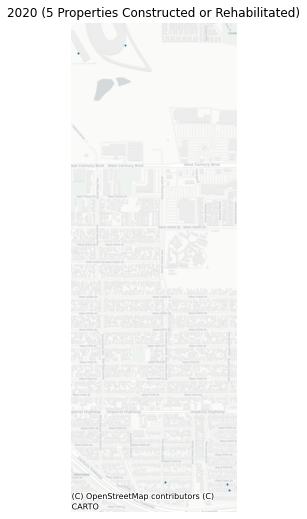

In [17]:
# use description variable
effectiveyearbuilt = '2020'

# map
ax = gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].plot(figsize=(9,9), markersize=1)

# title (including count)
ax.set_title(effectiveyearbuilt + ' (' + str(gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].shape[0]) + ' Properties Constructed or Rehabilitated)')

# axis
ax.axis('off')

# basemap
ctx.add_basemap(ax,
                crs='epsg:3857', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

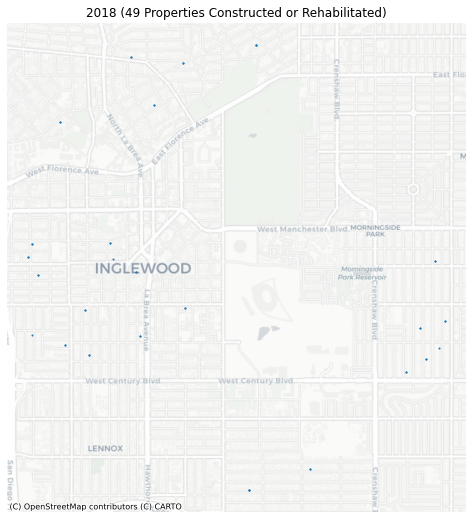

In [18]:
# use description variable
effectiveyearbuilt = '2018'

# map
ax = gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].plot(figsize=(9,9), markersize=1)

# title (including count)
ax.set_title(effectiveyearbuilt + ' (' + str(gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].shape[0]) + ' Properties Constructed or Rehabilitated)')

# axis
ax.axis('off')

# basemap
ctx.add_basemap(ax,
                crs='epsg:3857', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

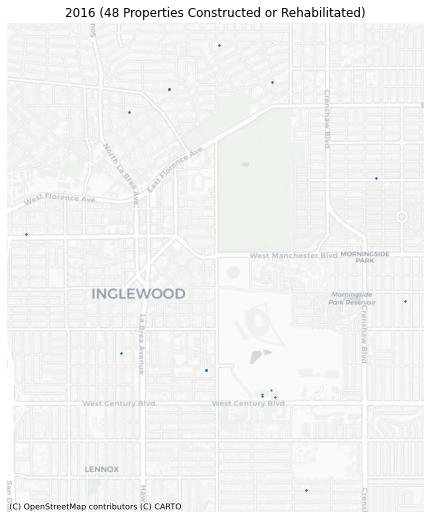

In [19]:
# use description variable
effectiveyearbuilt = '2016'

# map
ax = gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].plot(figsize=(9,9), markersize=1)

# title (including count)
ax.set_title(effectiveyearbuilt + ' (' + str(gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].shape[0]) + ' Properties Constructed or Rehabilitated)')

# axis
ax.axis('off')

# basemap
ctx.add_basemap(ax,
                crs='epsg:3857', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

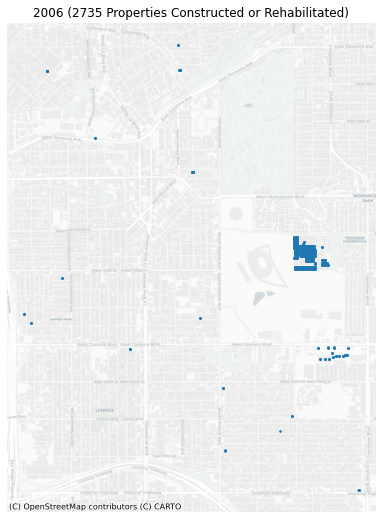

In [20]:
# use description variable
effectiveyearbuilt = '2006'

# map
ax = gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].plot(figsize=(9,9), markersize=1)

# title (including count)
ax.set_title(effectiveyearbuilt + ' (' + str(gdf20[gdf20.effectiveyearbuilt == effectiveyearbuilt].shape[0]) + ' Properties Constructed or Rehabilitated)')

# axis
ax.axis('off')

# basemap
ctx.add_basemap(ax,
                crs='epsg:3857', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

Based on the maps above, 2020 will most likely not be a year that provides us with much information given that it is the most recent and due to the pandemic, projects might have been delayed.

Now I can begin to create statistical visualizations for the effective year built to see which areas have expereicned the most cosntruction and hypothesize why that might be.

In [21]:
gdf20['x'] = gdf20.geometry.x
gdf20['y'] = gdf20.geometry.y

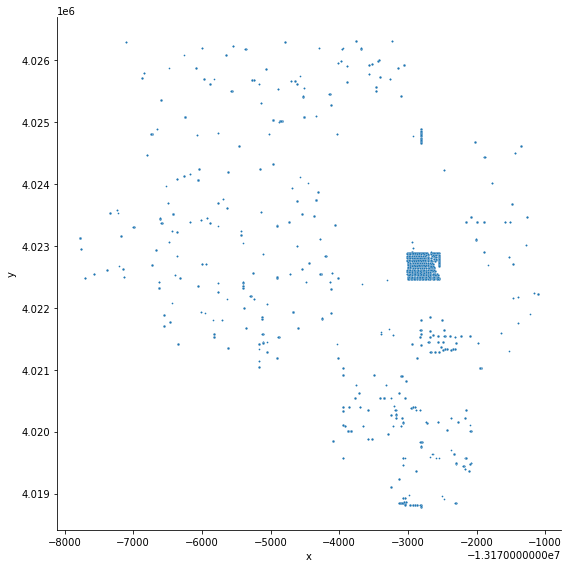

In [22]:
# scatterplot
sns.relplot(data=gdf20,
            x='x', 
            y='y',
            s=3, # size of point
            height=8 # size of plot
           )

In [23]:
color_list=['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']

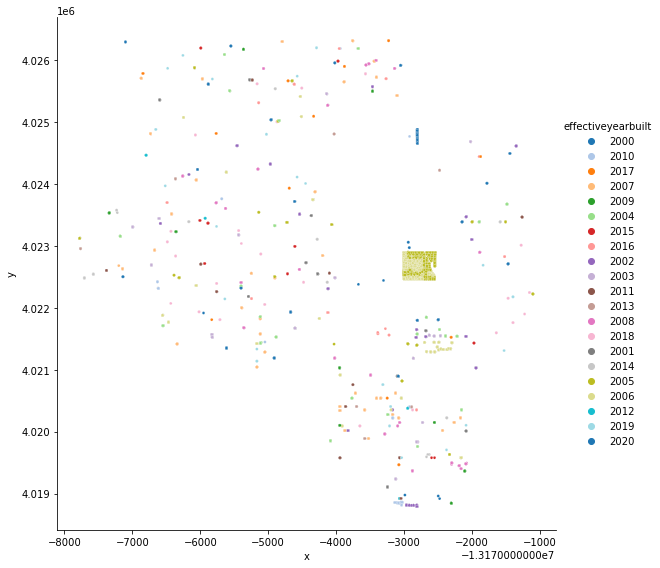

In [24]:
# scatterplot colored by area
sns.relplot(data=gdf20,
            x='x', 
            y='y',
            hue='effectiveyearbuilt',
            palette='tab20',
            s=8,
            height=8)

Now I will add a basemap to what I have plotted so that it is visually represented which areas within the City have experirenced construction during which years. The jointplot will help understand which year had the most construction during that 20 year timespan in the City.

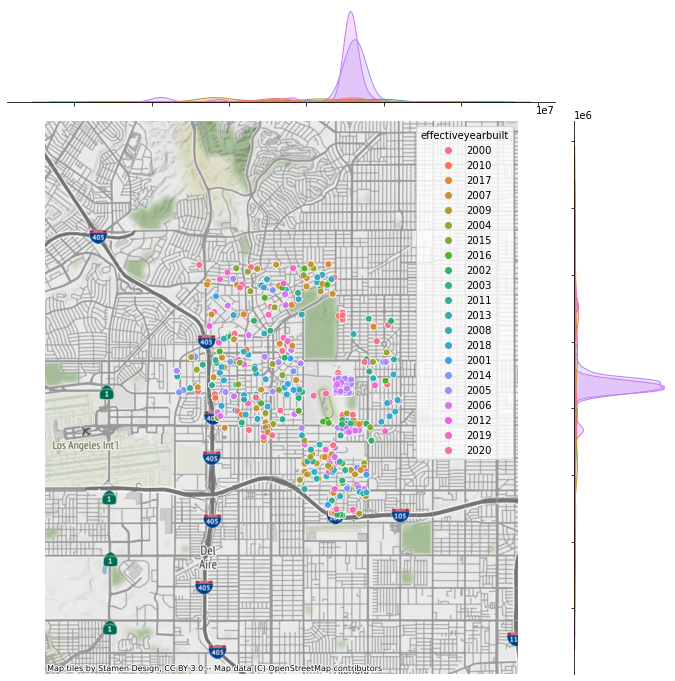

In [25]:
# color code by year
g = sns.jointplot(data = gdf20,
                  x='x', 
                  y='y',
                  hue='effectiveyearbuilt',
                  s=45,
                  height=10 # make the map bigger
                 )

# Clean axes
g.ax_joint.set_axis_off()

# add basemap
ctx.add_basemap(g.ax_joint,
                crs='epsg:3857')

These static maps are great, but I think an interactive map will make it more impactful and allow readers to see for themselves where the most cosntruction has occurred between 2000 and 2020.

In [26]:
# import folium, a leaflet python library
import folium
from folium.plugins import MarkerCluster

In [27]:
# create a list of lat/lon pair for UCLA
la = [34.0721237,-118.4440685]
m = folium.Map(location=la, zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

for index,row in df20.iterrows():
    folium.Marker(
        location=[row.center_lat,row.center_lon],
        popup=row.effectiveyearbuilt,
        icon=folium.Icon(color="red", icon="ok-sign"),
    ).add_to(marker_cluster)
m

In [28]:
# save as html file
m.save('effectiveyearbuilt.html')

So now we can see which areas have experienced the most construction, but I want to see where the mean and median centers are located based on this data, and also what parts of the City are captured in the Standard Deviation Ellipse. I calcualte these outputs in the next few cells to create a visual of the mean and median center along with the Standard Deviation Ellipse.

In [29]:
# compute the mean and median centers
mean_center = centrography.mean_center(gdf20[['x','y']])
med_center = centrography.euclidean_median(gdf20[['x','y']])

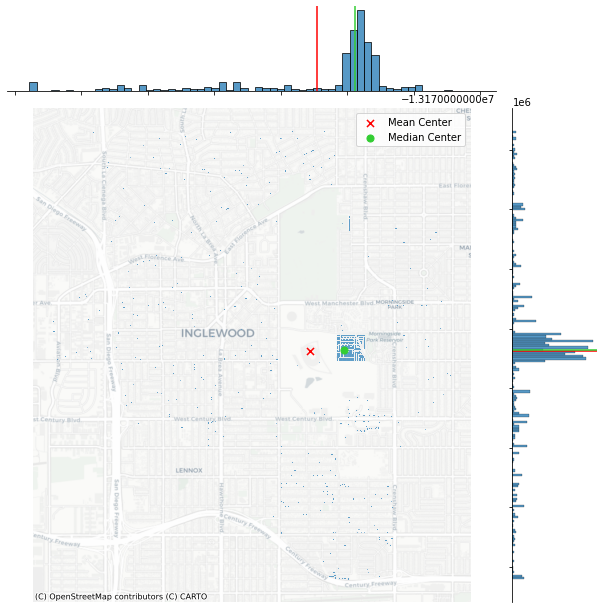

In [30]:
# Generate scatter plot
g = sns.jointplot(
    x='x', y='y', data=gdf20, s=0.75, height=9
)

# Add mean point and marginal lines
# *mean_center is shortcut for x=mean_center[0],y=mean_center[1]
g.ax_joint.scatter(
    *mean_center, color='red', marker='x', s=50, label='Mean Center'
)
g.ax_marg_x.axvline(mean_center[0], color='red')
g.ax_marg_y.axhline(mean_center[1], color='red')

# Add median point and marginal lines
g.ax_joint.scatter(
    *med_center, color='limegreen', marker='o', s=50, label='Median Center'
)
g.ax_marg_x.axvline(med_center[0], color='limegreen')
g.ax_marg_y.axhline(med_center[1], color='limegreen')

# Legend
g.ax_joint.legend()

# Add basemap
ctx.add_basemap(
    g.ax_joint, 
    crs='epsg:3857',
    source=ctx.providers.CartoDB.Positron
)

# Clean axes
g.ax_joint.set_axis_off()

# Display
plt.show()


In [31]:
major, minor, rotation = centrography.ellipse(gdf20[['x','y']])

In [32]:
mean_center

array([-13173462.82442643,   4022616.8019459 ])

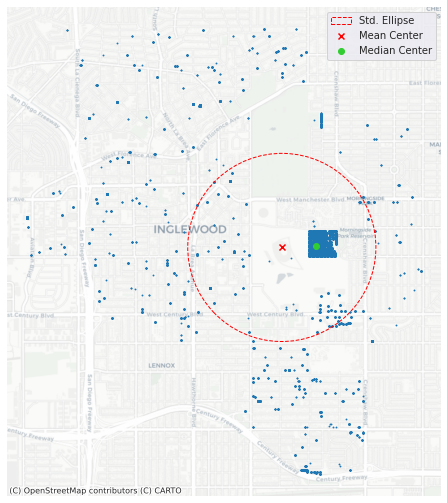

In [33]:
# set the style without grid lines
sns.set_style('dark')

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Plot points
ax.scatter(gdf20['x'], gdf20['y'], s=0.75)
ax.scatter(*mean_center, color='red', marker='x', label='Mean Center')
ax.scatter(*med_center, color='limegreen', marker='o', label='Median Center')

# Construct the standard ellipse using matplotlib
ellipse = Ellipse(xy=mean_center, # center the ellipse on our mean center
                  width=major*2, # centrography.ellipse only gives half the axis
                  height=minor*2, 
                  angle = numpy.rad2deg(rotation), # Angles for this are in degrees, not radians
                  facecolor='none', 
                  edgecolor='red', 
                  linestyle='--',
                  label='Std. Ellipse')

ax.add_patch(ellipse)

ax.legend()

ax.axis('off')

# add a basemap
ctx.add_basemap(ax,
                crs='epsg:3857',
                source=ctx.providers.CartoDB.Positron)

# Display
plt.show()

#### Conclusion
Based on the effective year analysis, we can see where most of the cosntruction has occurred in Inglewood in the last 20 years. Due to the mass construction that occurred in 2005 and 2006 the median center is pulled east of the Stadium and the mena center is right were SoFi is located. It will be intersting to see in the next ten years how much of the surroudning properties will undergo construction based on where the standard deviation ellipse is lcoated.  